# IMAGEN - SUMMARY STATISTICS

The preliminary results in our IMAGEN paper advocates for a more in-depth understanding of what contributes to the significant performance of the ML models for the three time-points: <br>
<li>Baseline (<b>BL</b>): Age <tr> <b>14</b></li>
<li>Follow 1 year (<b>FU1</b>): Age <b>16</b></li>
<li>Follow 2 year (<b>FU2</b>): Age <b>19</b></li>
<li>Follow 3 year (<b>FU3</b>): Age <b>22</b></li>
<br>
Such in-depth understanding can be achieved by performing follow-up analysis such as: <br>
<li> Summary Statistics on Psychological profile </li>
<li> Summary Statistics on Socio-economic profile </li>
<li> Summary Statistics on Other co-morbidities </li>

## Overview
1. **NEO PI-R** (NEO; Costa & McCrae, 1992)
2. Substance Use Risk Profile Scale (**SURPS**; Conrod & Woicik, 2002, Woicik et al., 2009) 
3. Fagerstrom Test for Nicotine Dependence (**FTND**; Heatherton et al., 1991)
4. Basic Symptom Inventory - 53 (**BSI-53**; Derogatis, 1975; Derogatis & Melisaratos, 1983; Derogatis & Spencer, 1982)
5. Life-Events Questionnaire (**LEQ**; adapted from Newcomb et al., 1981)

In [1]:
################################################################################
""" IMAGEN - SUMMARY STATISTICS """
# Author : JiHoon Kim, <jihoon.kim@fu-berlin.de>, 17th August 2021
#
from imagen_instrumentloader import *
from imagen_plot_statistics import *
# DATA_DIR = '/ritter/share/data/IMAGEN'

## Psychological profile

### NEO-PI-R FU3
The NEO-PI-R is a valid method of assessing broad dimensions of personality (De Fruyt, et al. 2000) based on the Five-Factor Model of personality (Costa and McCrea, 1997). Neuroticism: tendency toward unstable emotions (neur), Extroversion: sociability, assertiveness, emotional expression (extr), Openness: imagination, feelings, actions, ideas (open), Agreeableness: cooperative, trustworthy, good-natured (agre), Conscientiousness: competence, self-discipline, thoughtfulness, goal-driven (cons).

In [9]:
binge_FU3_NEO = IMAGEN_instrument()
df_binge_FU3_NEO, col_binge_FU3_NEO = binge_FU3_NEO.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5", # h5files
    "FU3",                                     # session
    "IMAGEN-IMGN_NEO_FFI_FU3.csv",             # instrument
    "NEO",                                     # roi name
    save = False,                               # save
    viz = True)                                # summary

# binge_FU3_NEO = IMAGEN_quick()
# df_binge_FU3_NEO, col_binge_FU3_NEO = binge_FU3_NEO.to_instrument(
#     "newlbls-fu3-espad-fu3-19a-binge-n650_FU3_NEO.csv", # instrument
#     viz = True)                                         # summary

----------------------------------------------------------------------------------- 
Step 1. load the phenotype: newlbls-fu3-espad-fu3-19a-binge-n650
        Class = Binge, n = 650 (HC = 282, AAM = 368)
Step 2. load the instrument dataset: IMAGEN-IMGN_NEO_FFI_FU3
Step 3. generate the FU3_newlbls-fu3-espad-fu3-19a-binge-n650_NEO_FFI_FU3.csv
        The dataset contains 650 samples and 8 columns
Step 4. select FU3_newlbls-fu3-espad-fu3-19a-binge-n650_NEO_FFI_FU3.csv
        The dataset contains 650 samples and 8 columns
        Variables = ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean', 'Sex', 'Site', 'Class'] 
-----------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 650 entries, 112288 to 99930021
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Neuroticism mea

,Neuroticism mean,Extroversion mean,Openness mean,Agreeableness mean,Conscientiousness mean
Class,,,,,
AAM,1.730752,2.525362,2.584239,2.731884,2.538949
HC,1.738475,2.303191,2.458038,2.744681,2.736998


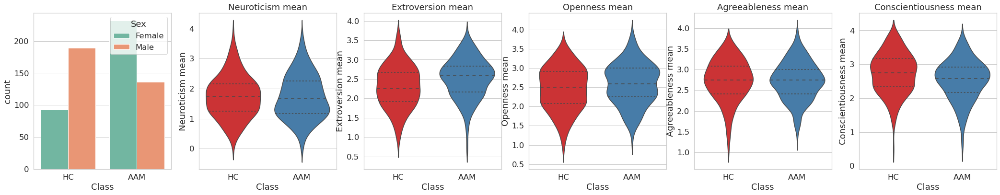

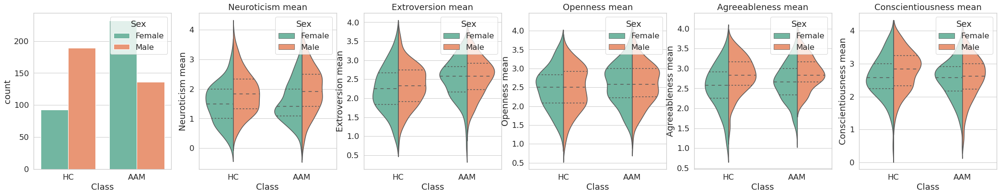

In [10]:
DF = df_binge_FU3_NEO
COL = col_binge_FU3_NEO

plot_binge_FU3_NEO = IMAGEN_descriptive(DF, COL)
plot_binge_FU3_NEO.violinplot()
DF.groupby("Class")[COL].mean()

In [11]:
DF.groupby(["Sex", "Class"])[COL].mean()

Neuroticism mean  Extroversion mean  Openness mean  \
Sex    Class                                                       
Female AAM            1.595905           2.497486       2.586207   
       HC             1.505376           2.238351       2.474014   
Male   AAM            1.960784           2.572917       2.580882   
       HC             1.853175           2.335097       2.450176   

              Agreeableness mean  Conscientiousness mean  
Sex    Class                                              
Female AAM              2.633980                2.508621  
       HC               2.534050                2.592294  
Male   AAM              2.898897                2.590686  
       HC               2.848325                2.808201

In [12]:
# Normality Test and Independent T test
from scipy.stats import shapiro, levene, ttest_ind, bartlett
for mean in COL[:-3]:
    print("-"*10, mean)
    myAAM = list(DF[DF['Class'] == 'AAM'][mean].values)
    AAM = [x for x in myAAM if pd.isnull(x) == False]
    myHC = list(DF[DF['Class'] == 'HC'][mean].values)    
    HC = [x for x in myHC if pd.isnull(x) == False]
    
    # Shapiro-Wilks
    normal1 = shapiro(AAM)
    normal2 = shapiro(HC)
    print(normal1, normal2)
    # Levene test
    print(levene(AAM, HC))
    # bartlett test
    print(bartlett(AAM, HC))
    # ttest
    print(ttest_ind(AAM, HC))
    print(ttest_ind(AAM, HC, equal_var=False))

---------- Neuroticism mean
ShapiroResult(statistic=0.9844947457313538, pvalue=0.0005509337643161416) ShapiroResult(statistic=0.9916834235191345, pvalue=0.11304288357496262)
LeveneResult(statistic=1.6915659646719141, pvalue=0.1938570071253325)
BartlettResult(statistic=0.8693549956966128, pvalue=0.3511339349823773)
Ttest_indResult(statistic=-0.13560394867758788, pvalue=0.8921764963743465)
Ttest_indResult(statistic=-0.13654859899894203, pvalue=0.8914319809627931)
---------- Extroversion mean
ShapiroResult(statistic=0.9840741157531738, pvalue=0.00043959004688076675) ShapiroResult(statistic=0.9936059713363647, pvalue=0.27583783864974976)
LeveneResult(statistic=3.1694971639760157, pvalue=0.07549400757899889)
BartlettResult(statistic=1.4919151770823909, pvalue=0.22191954692719826)
Ttest_indResult(statistic=5.326249811794161, pvalue=1.3846542285027802e-07)
Ttest_indResult(statistic=5.278308423009785, pvalue=1.842314683158053e-07)
---------- Openness mean
ShapiroResult(statistic=0.990659415721

----------------------------------------------------------------------------------- 
Plot 1. histogram: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 2. pariplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 3. violinplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 4. catplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 5. barplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean'] 
-----------------------------------------------------------------------------------


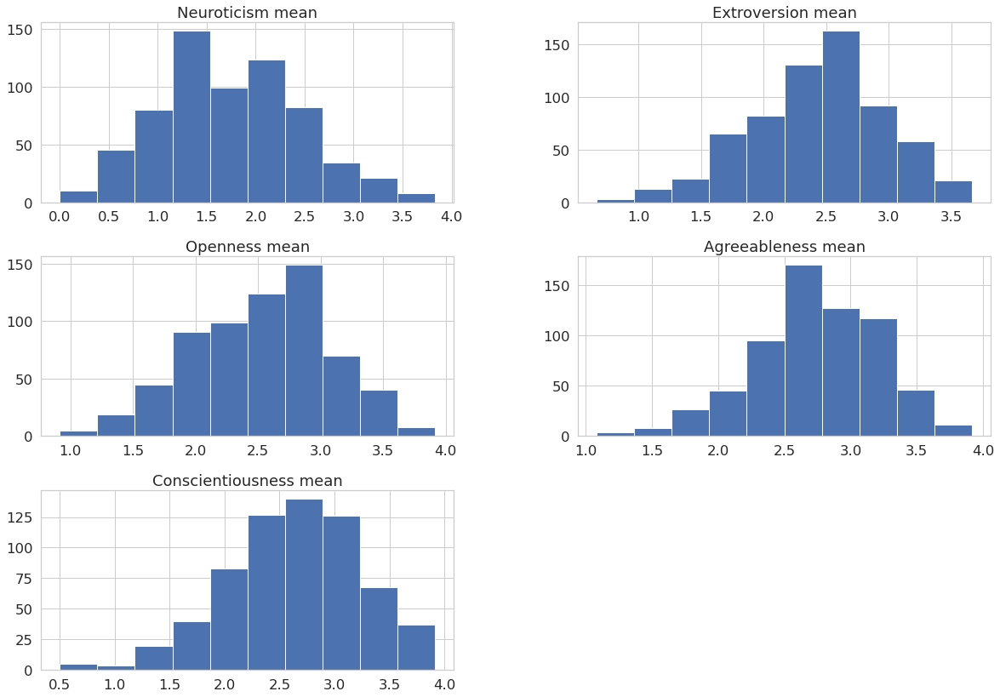

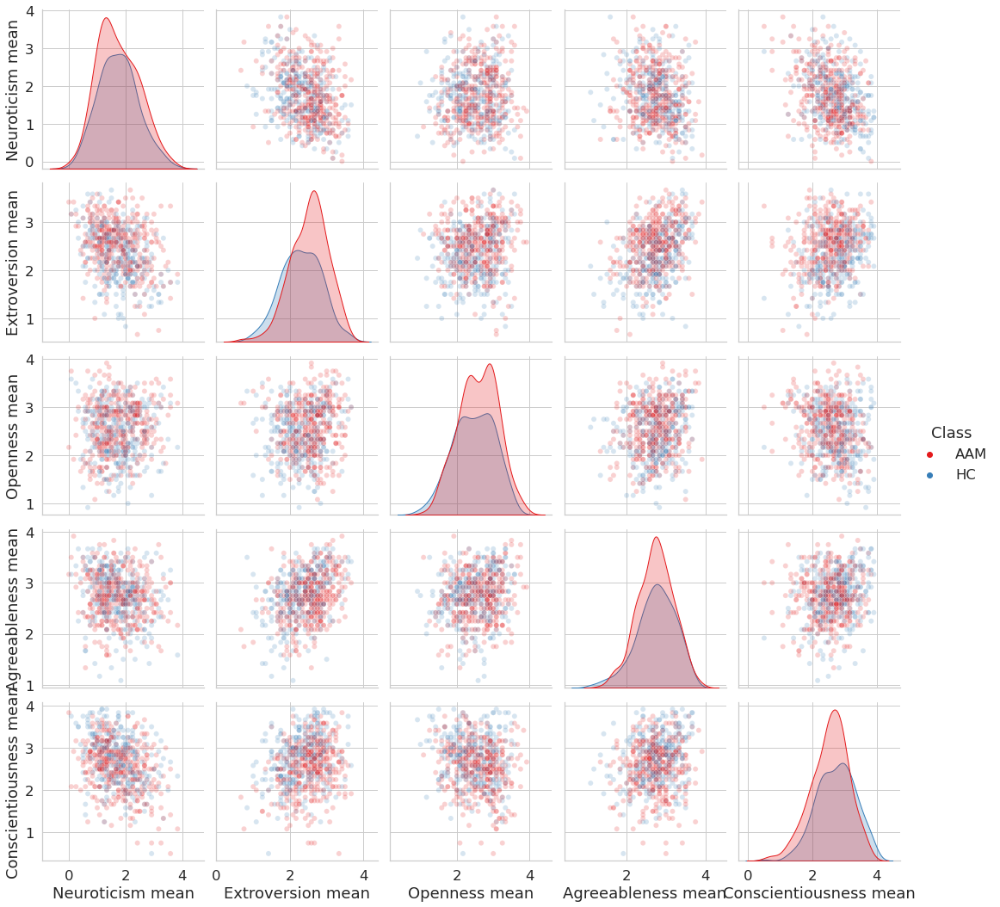

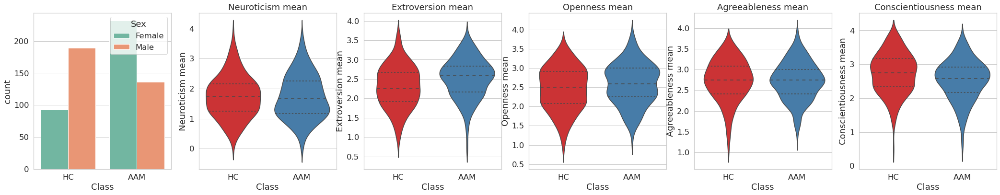

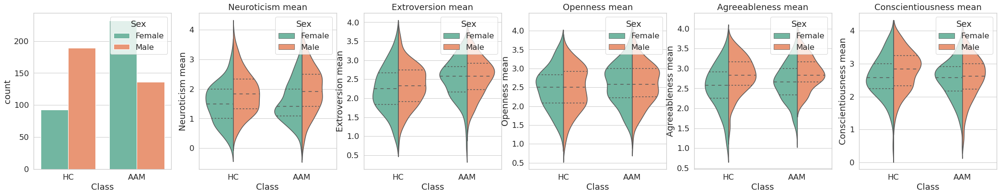

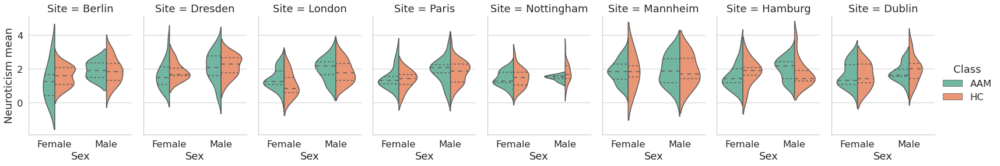

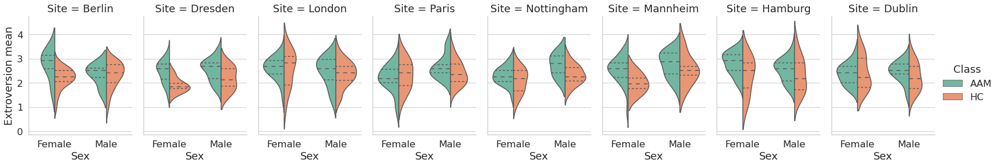

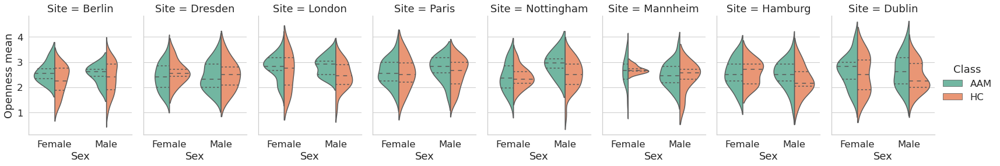

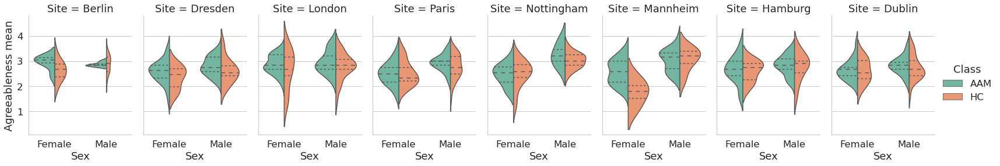

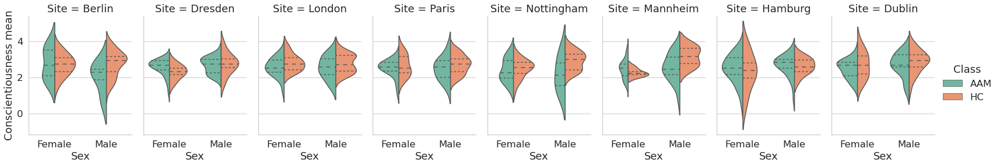

In [6]:
plot_binge_FU3_NEO = IMAGEN_descriptive(df_binge_FU3_NEO, col_binge_FU3_NEO)
plot_binge_FU3_NEO.demographic_plot(viz=True)

In [7]:
binge_FU2_NEO = IMAGEN_instrument()
df_binge_FU2_NEO, col_binge_FU2_NEO = binge_FU2_NEO.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",          # h5files
    "FU2",                                              # session
    "IMAGEN-IMGN_NEO_FFI_FU2-IMAGEN_SURVEY_DIGEST.csv", # instrument
    "NEO",                                              # name
    save = False,                                       # save
    viz = True)                                         # summary

----------------------------------------------------------------------------------- 
Step 1. load the phenotype: newlbls-fu3-espad-fu3-19a-binge-n650
        Class = Binge, n = 650 (HC = 282, AAM = 368)
Step 2. load the instrument dataset: IMAGEN-IMGN_NEO_FFI_FU2-IMAGEN_SURVEY_DIGEST
Step 3. generate the FU2_newlbls-fu3-espad-fu3-19a-binge-n650_NEO_FFI_FU2-IMAGEN_SURVEY_DIGEST.csv
        The dataset contains 650 samples and 8 columns
Step 4. select FU2_newlbls-fu3-espad-fu3-19a-binge-n650_NEO_FFI_FU2-IMAGEN_SURVEY_DIGEST.csv
        The dataset contains 650 samples and 8 columns
        Variables = ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean', 'Sex', 'Site', 'Class'] 
-----------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 650 entries, 112288 to 99930021
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype  
---  -----

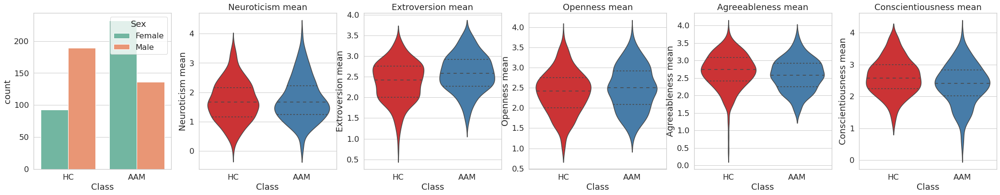

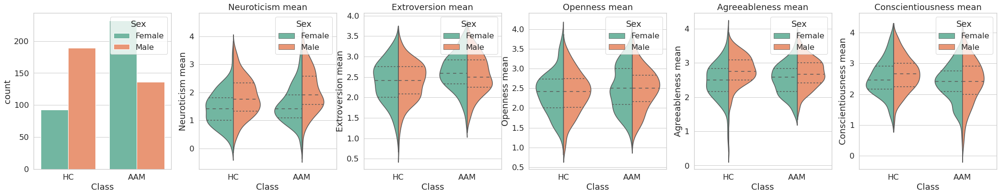

In [8]:
DF = df_binge_FU2_NEO
COL = col_binge_FU2_NEO

plot_binge_FU2_NEO = IMAGEN_descriptive(DF, COL)
plot_binge_FU2_NEO.violinplot()

----------------------------------------------------------------------------------- 
Plot 1. histogram: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 2. pariplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 3. violinplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 4. catplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 5. barplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean'] 
-----------------------------------------------------------------------------------


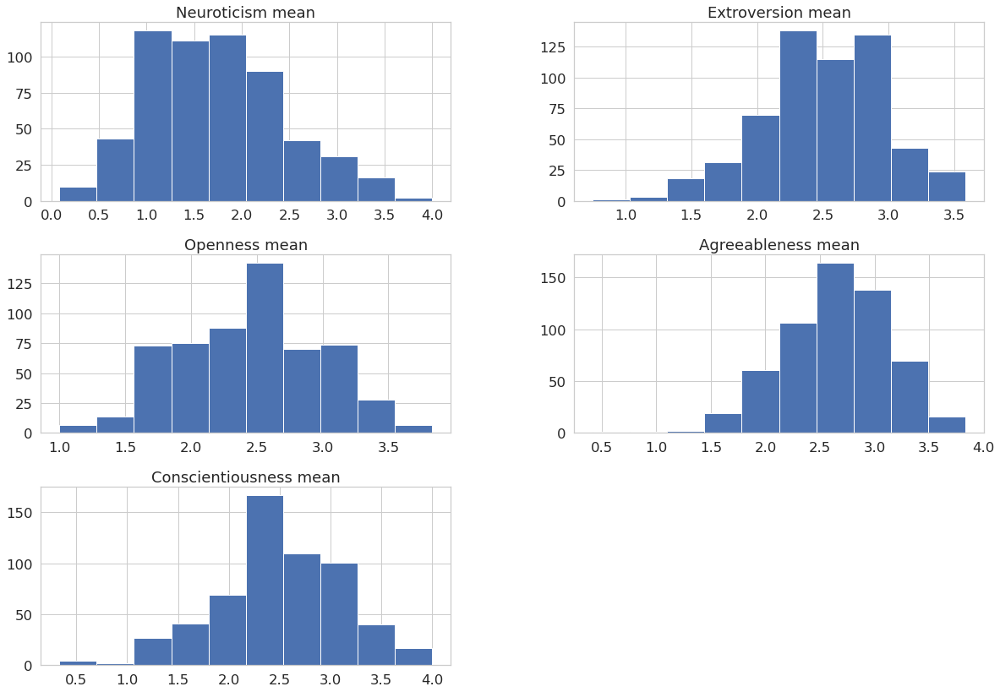

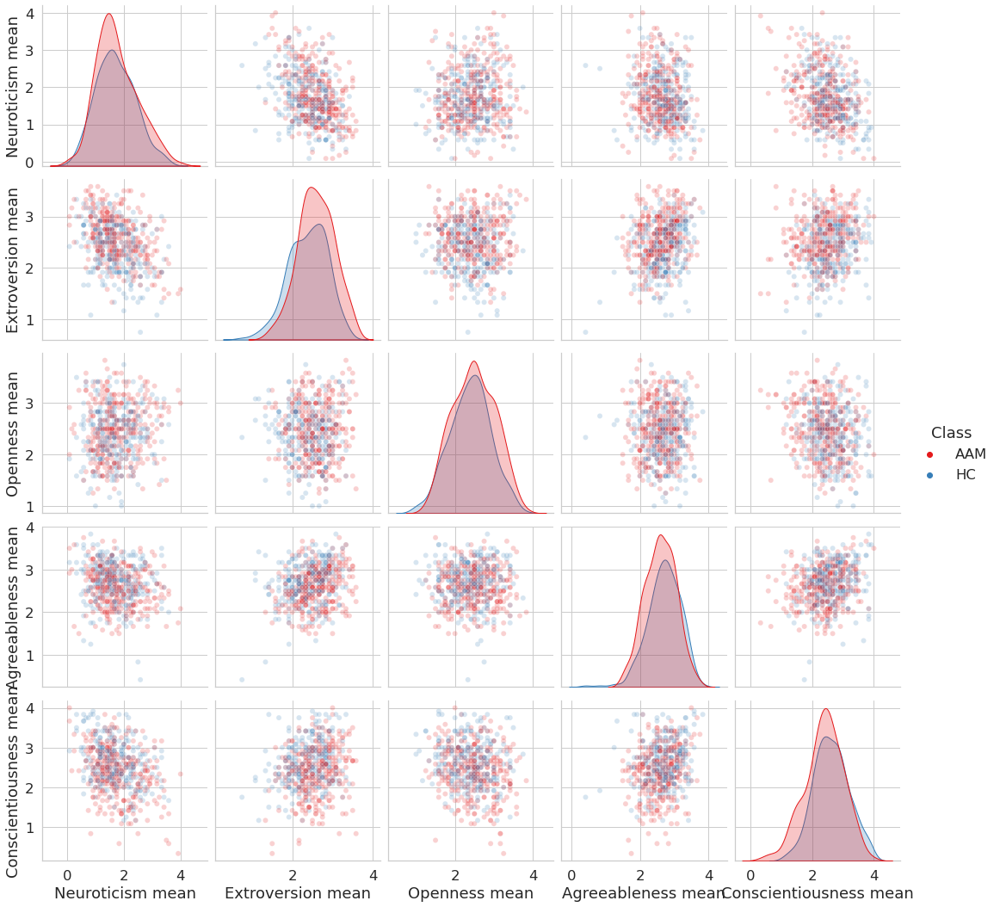

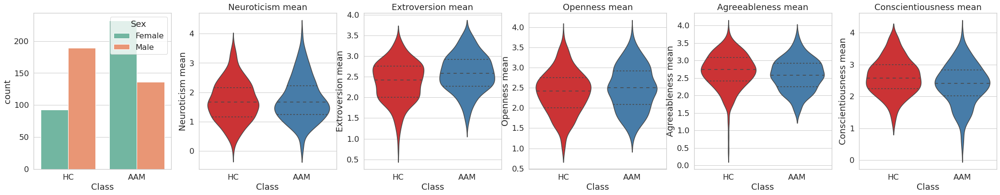

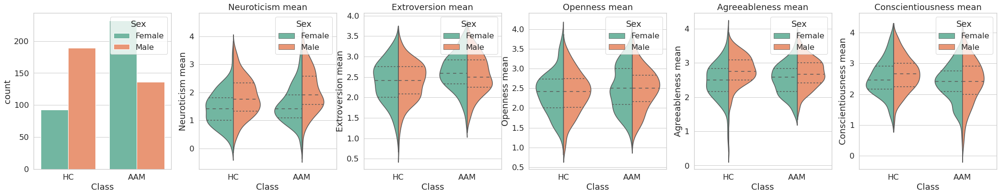

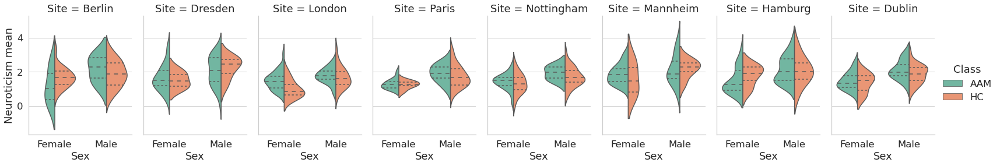

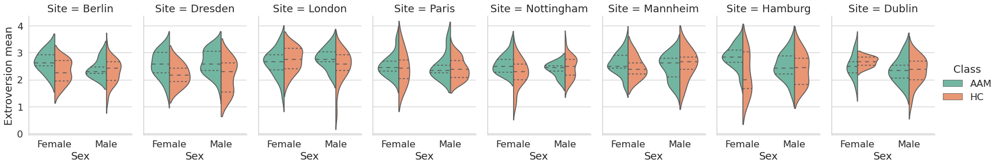

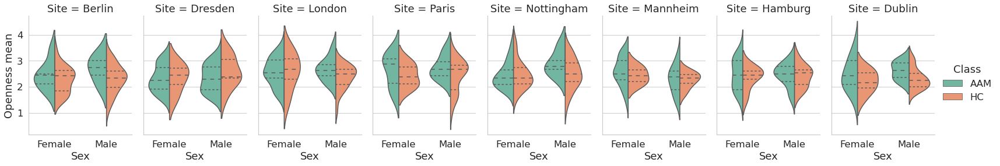

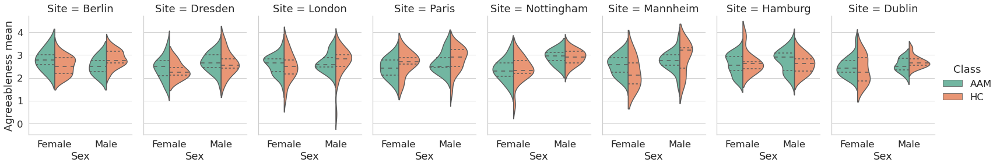

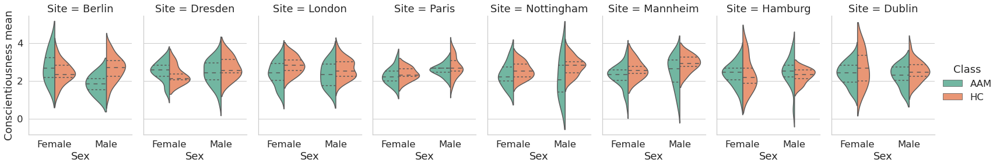

In [11]:
plot_binge_FU2_NEO = IMAGEN_descriptive(df_binge_FU2_NEO, col_binge_FU2_NEO)
plot_binge_FU2_NEO.demographic_plot(viz=True)

In [12]:
binge_FU1_NEO = IMAGEN_instrument()
df_binge_FU1_NEO, col_binge_FU1_NEO = binge_FU1_NEO.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",                   # h5files
    "FU1",                                                       # session
    "IMAGEN-IMGN_NEO_FFI_CHILD_FU_RC5-IMAGEN_SURVEY_DIGEST.csv", # instrument
    "NEO",                                                       # name
    save = False,                                                # save
    viz = True)                                                  # summary

----------------------------------------------------------------------------------- 
Step 1. load the phenotype: newlbls-fu3-espad-fu3-19a-binge-n650
        Class = Binge, n = 650 (HC = 282, AAM = 368)
Step 2. load the instrument dataset: IMAGEN-IMGN_NEO_FFI_CHILD_FU_RC5-IMAGEN_SURVEY_DIGEST
Step 3. generate the FU1_newlbls-fu3-espad-fu3-19a-binge-n650_NEO_FFI_CHILD_FU_RC5-IMAGEN_SURVEY_DIGEST.csv
        The dataset contains 650 samples and 8 columns
Step 4. select FU1_newlbls-fu3-espad-fu3-19a-binge-n650_NEO_FFI_CHILD_FU_RC5-IMAGEN_SURVEY_DIGEST.csv
        The dataset contains 650 samples and 8 columns
        Variables = ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean', 'Sex', 'Site', 'Class'] 
-----------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 650 entries, 112288 to 99930021
Data columns (total 8 columns):
 #   Column                  Non-Nul

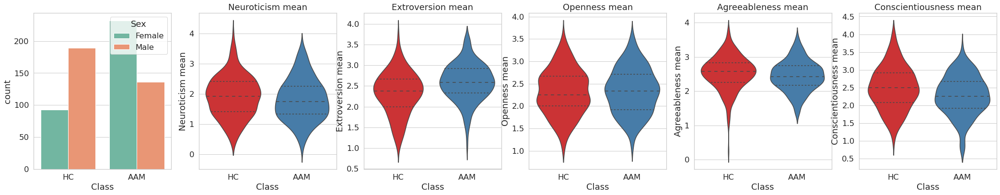

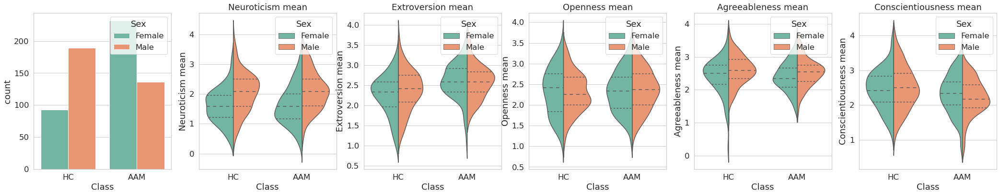

In [13]:
DF = df_binge_FU1_NEO
COL = col_binge_FU1_NEO

plot_binge_FU1_NEO = IMAGEN_descriptive(DF, COL)
plot_binge_FU1_NEO.violinplot()

----------------------------------------------------------------------------------- 
Plot 1. histogram: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 2. pariplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 3. violinplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 4. catplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 5. barplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean'] 
-----------------------------------------------------------------------------------


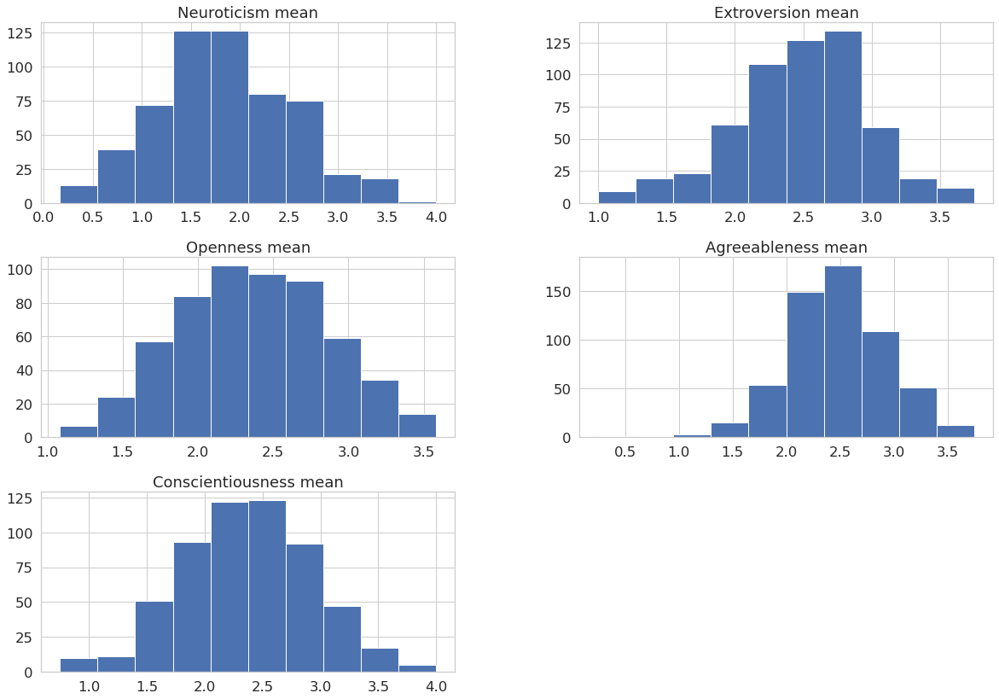

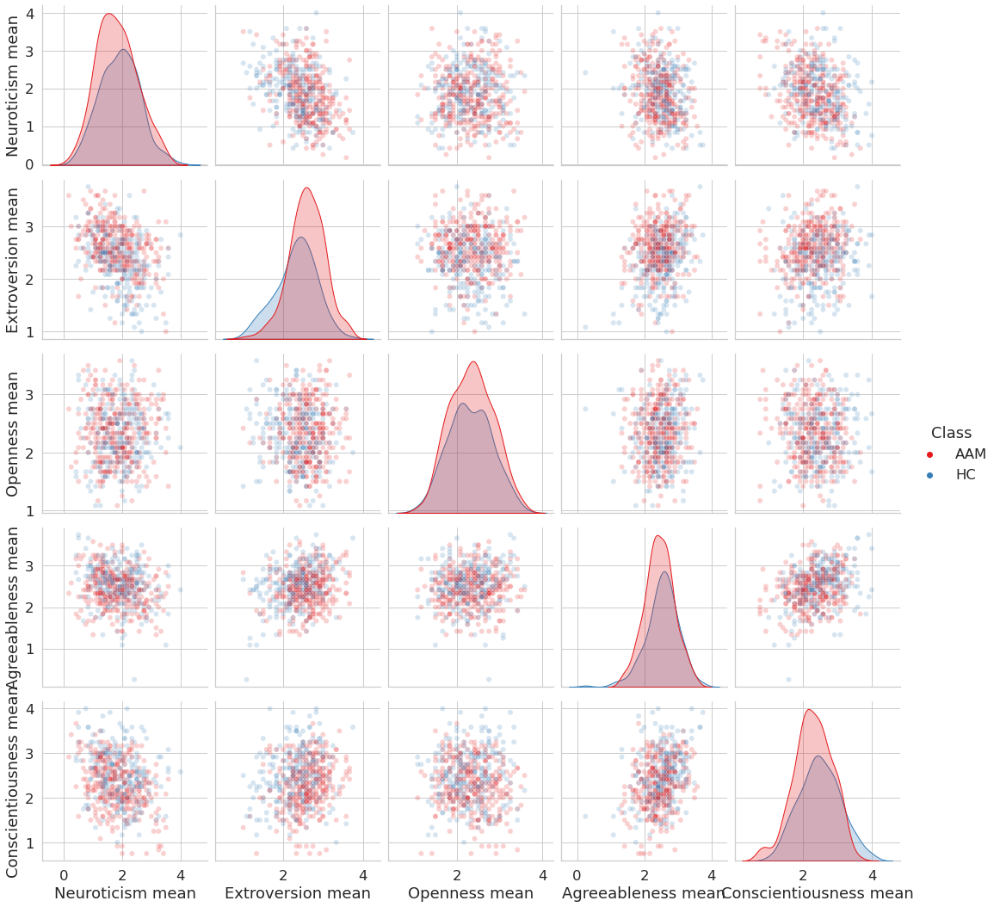

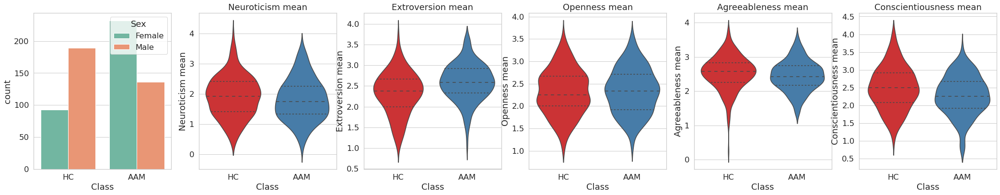

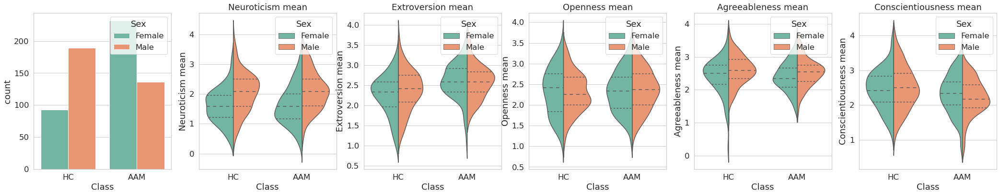

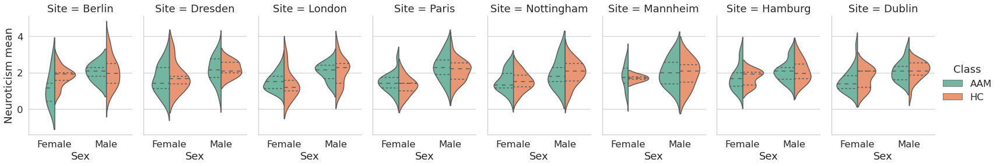

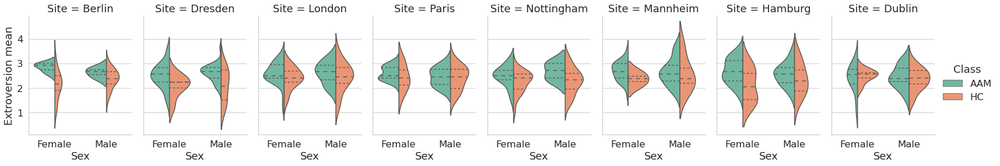

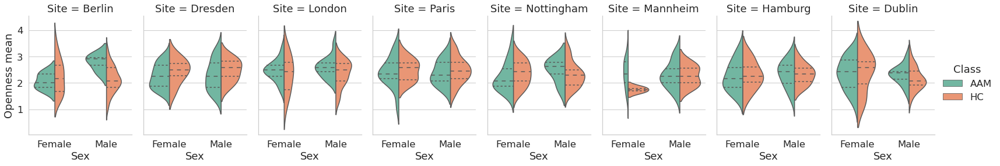

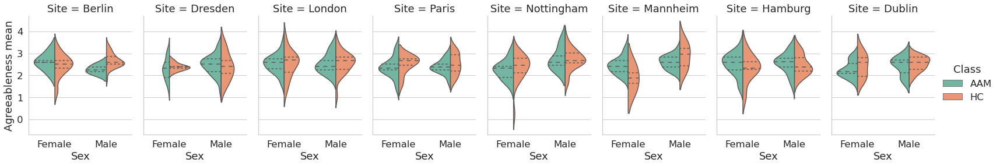

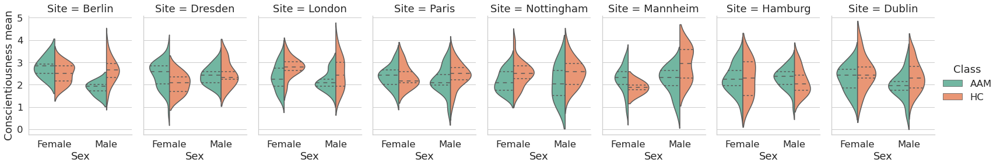

In [16]:
plot_binge_FU1_NEO = IMAGEN_descriptive(df_binge_FU1_NEO, col_binge_FU1_NEO)
plot_binge_FU1_NEO.demographic_plot(viz=True)

In [17]:
binge_BL_NEO = IMAGEN_instrument()
df_binge_BL_NEO, col_binge_BL_NEO = binge_BL_NEO.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",                # h5files
    "BL",                                                     # session
    "IMAGEN-IMGN_NEO_FFI_CHILD_RC5-IMAGEN_SURVEY_DIGEST.csv", # instrument
    "NEO",                                                    # name
    save = False,                                             # save
    viz = True)                                               # summary

----------------------------------------------------------------------------------- 
Step 1. load the phenotype: newlbls-fu3-espad-fu3-19a-binge-n650
        Class = Binge, n = 650 (HC = 282, AAM = 368)
Step 2. load the instrument dataset: IMAGEN-IMGN_NEO_FFI_CHILD_RC5-IMAGEN_SURVEY_DIGEST
Step 3. generate the BL_newlbls-fu3-espad-fu3-19a-binge-n650_NEO_FFI_CHILD_RC5-IMAGEN_SURVEY_DIGEST.csv
        The dataset contains 650 samples and 8 columns
Step 4. select BL_newlbls-fu3-espad-fu3-19a-binge-n650_NEO_FFI_CHILD_RC5-IMAGEN_SURVEY_DIGEST.csv
        The dataset contains 650 samples and 8 columns
        Variables = ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean', 'Sex', 'Site', 'Class'] 
-----------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 650 entries, 112288 to 99930021
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dt

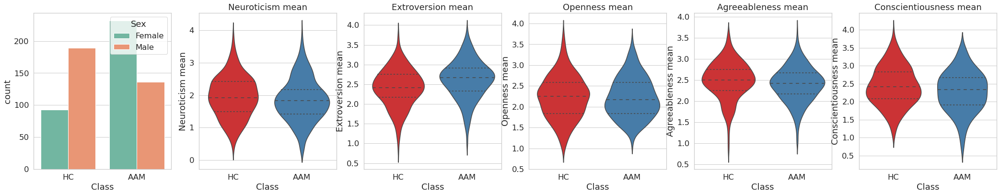

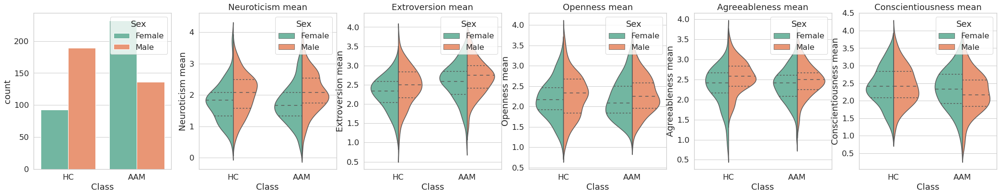

In [18]:
DF = df_binge_BL_NEO
COL = col_binge_BL_NEO

plot_binge_BL_NEO = IMAGEN_descriptive(DF, COL)
plot_binge_BL_NEO.violinplot()

----------------------------------------------------------------------------------- 
Plot 1. histogram: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 2. pariplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 3. violinplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 4. catplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean']
Plot 5. barplot: ['Neuroticism mean', 'Extroversion mean', 'Openness mean', 'Agreeableness mean', 'Conscientiousness mean'] 
-----------------------------------------------------------------------------------


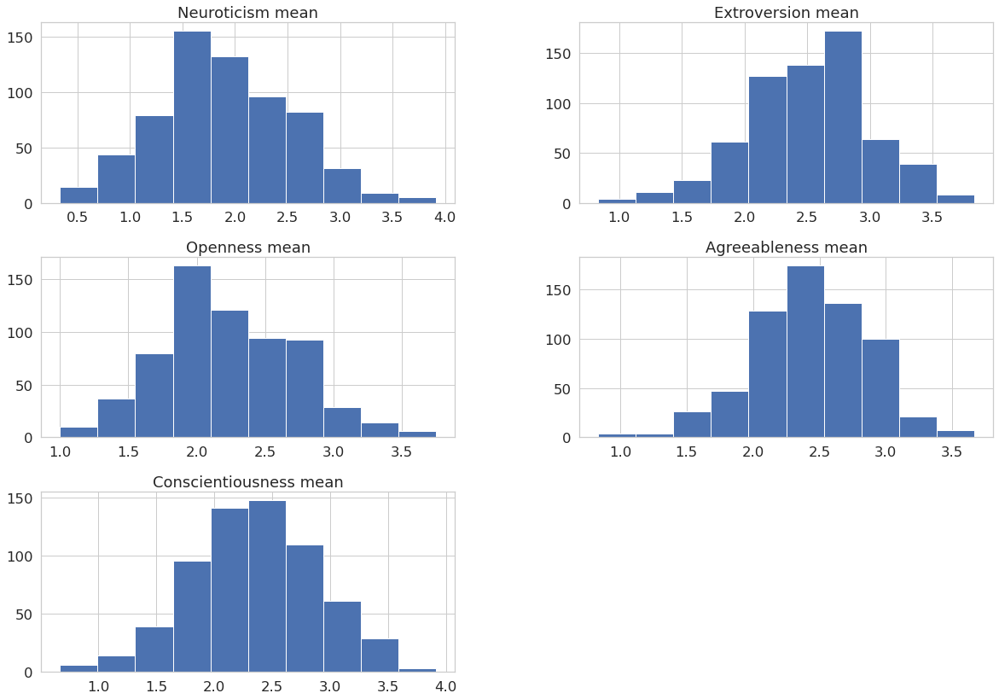

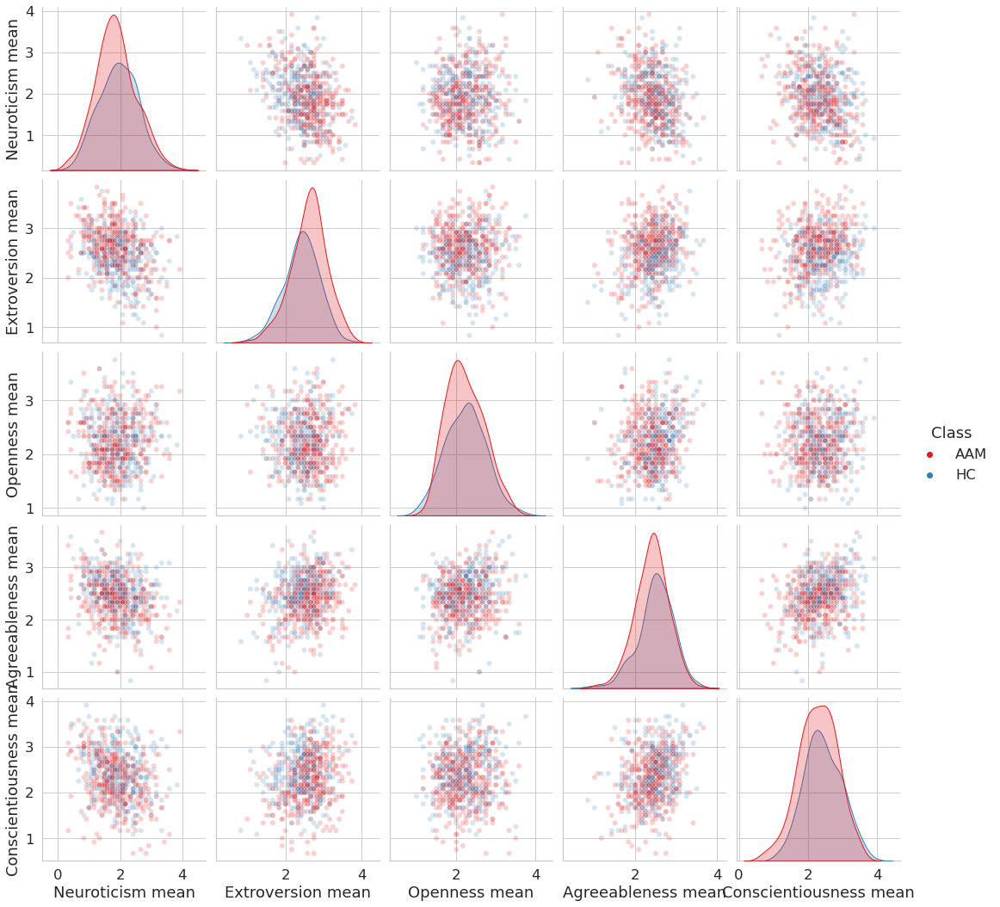

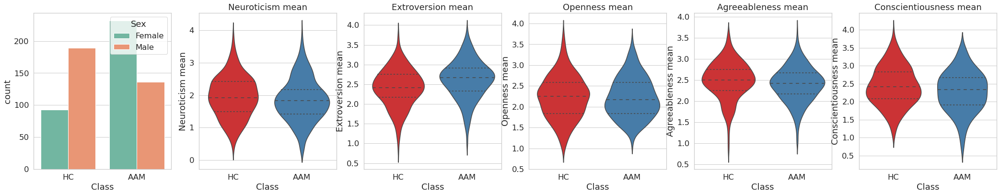

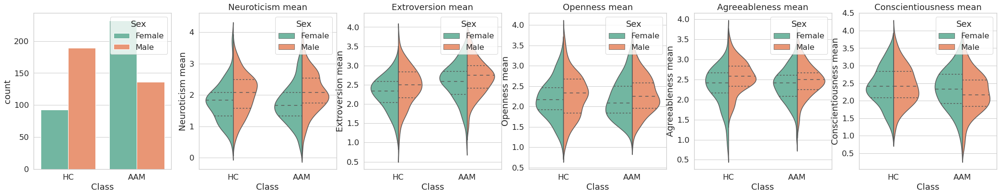

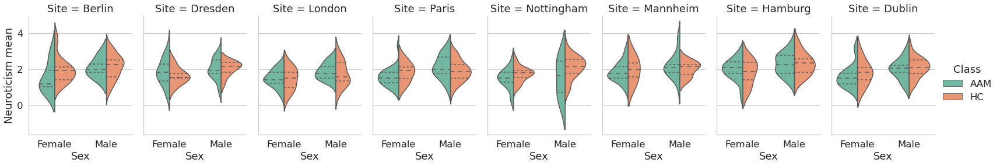

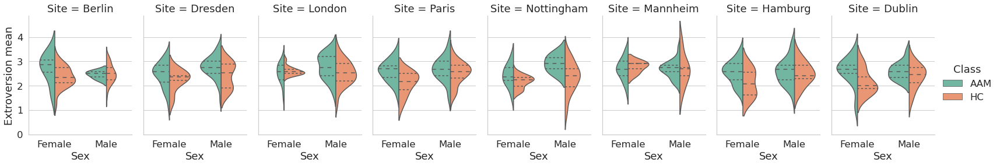

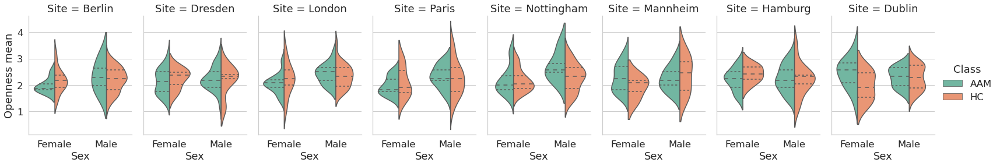

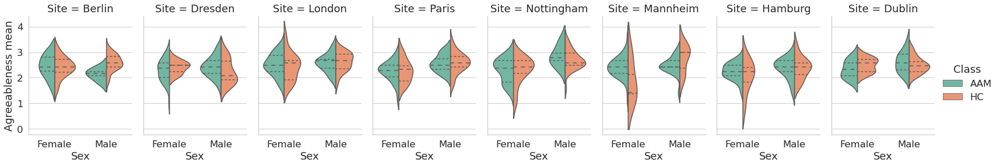

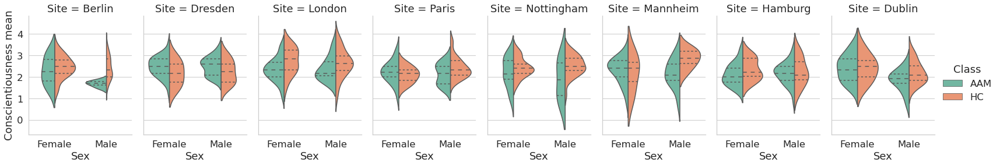

In [21]:
plot_binge_BL_NEO = IMAGEN_descriptive(df_binge_BL_NEO, col_binge_BL_NEO)
plot_binge_BL_NEO.demographic_plot(viz=True)

### SURPS
Assesses lower order personality traits related to psychopathology (e.g., anxiety sensitivity, thrill seeking, pessimism and impulsivity). The Substance Use Risk Profile Scale (SURPS; Conrod & Woicik, 2002) assesses levels of several personality risk factors for substance abuse/dependence and psychopathology including hopelessness (h), anxiety sensitivity (as), impulsivity (imp) and sensation seeking (ss).

In [5]:
binge_FU3_SURPS = IMAGEN_instrument()
df_binge_FU3_SURPS, col_binge_FU3_SURPS = binge_FU3_SURPS.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5", # h5files
    "FU3",                                     # session
    "IMAGEN-IMGN_SURPS_FU3.csv",               # instrument
    "SURPS",                                   # name
    save = False,                              # save
    viz = True)                                # summary

----------------------------------------------------------------------------------- 
Step 1. load the phenotype: newlbls-fu3-espad-fu3-19a-binge-n650
        Class = Binge, n = 650 (HC = 282, AAM = 368)
Step 2. load the instrument dataset: IMAGEN-IMGN_SURPS_FU3
Step 3. generate the FU3_newlbls-fu3-espad-fu3-19a-binge-n650_SURPS_FU3.csv
        The dataset contains 650 samples and 7 columns
Step 4. select FU3_newlbls-fu3-espad-fu3-19a-binge-n650_SURPS_FU3.csv
        The dataset contains 650 samples and 7 columns
        Variables = ['Hopelessness mean', 'Anxiety sensitivity mean', 'Impulsivity mean', 'Sensation seeking mean', 'Sex', 'Site', 'Class'] 
-----------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 650 entries, 112288 to 99930021
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Hopelessness mean         64

In [8]:
# Normality Test and Independent T test
from scipy.stats import shapiro, levene, ttest_ind, bartlett
for mean in COL[:-3]:
    print("-"*10, mean)
    myAAM = list(DF[DF['Class'] == 'AAM'][mean].values)
    AAM = [x for x in myAAM if pd.isnull(x) == False]
    myHC = list(DF[DF['Class'] == 'HC'][mean].values)    
    HC = [x for x in myHC if pd.isnull(x) == False]
    
    # Shapiro-Wilks
    normal1 = shapiro(AAM)
    normal2 = shapiro(HC)
    print(normal1, normal2)
    # Levene test
    print(levene(AAM, HC))
    # bartlett test
    print(bartlett(AAM, HC))
    # ttest
    print(ttest_ind(AAM, HC))
    print(ttest_ind(AAM, HC, equal_var=False))

---------- Hopelessness mean
ShapiroResult(statistic=0.9636257290840149, pvalue=6.538763841490436e-08) ShapiroResult(statistic=0.9609880447387695, pvalue=6.903546250214276e-07)
LeveneResult(statistic=0.0054866997957004095, pvalue=0.940975781954901)
BartlettResult(statistic=0.3965051108589706, pvalue=0.5288997051299669)
Ttest_indResult(statistic=0.6452114425825131, pvalue=0.5190188973181975)
Ttest_indResult(statistic=0.6422325676681335, pvalue=0.5209700724854105)
---------- Anxiety sensitivity mean
ShapiroResult(statistic=0.9804267883300781, pvalue=6.973323615966365e-05) ShapiroResult(statistic=0.9820097088813782, pvalue=0.0012795679504051805)
LeveneResult(statistic=0.31044478470598247, pvalue=0.5776000683214959)
BartlettResult(statistic=0.8847627595066794, pvalue=0.34690050774160786)
Ttest_indResult(statistic=0.04682270327221685, pvalue=0.9626689827922518)
Ttest_indResult(statistic=0.04714862257788301, pvalue=0.9624099773146513)
---------- Impulsivity mean
ShapiroResult(statistic=0.977

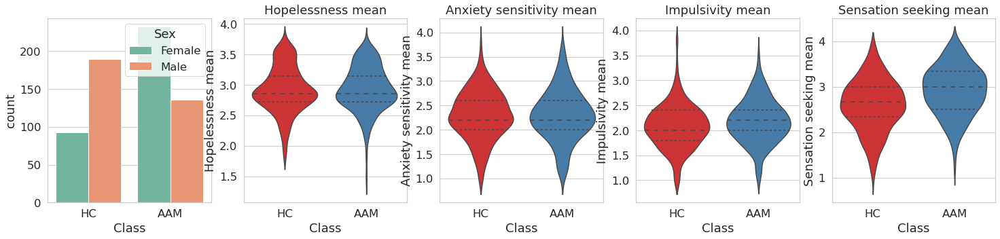

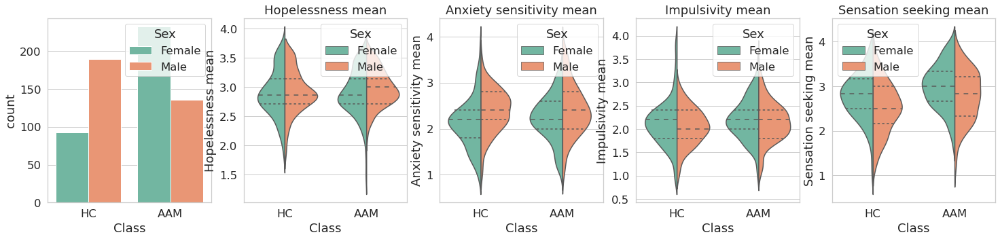

In [3]:
DF = df_binge_FU3_SURPS
COL = col_binge_FU3_SURPS

plot_binge_FU3_SURPS = IMAGEN_descriptive(DF, COL)
plot_binge_FU3_SURPS.violinplot()

In [ ]:
binge_FU2_SURPS = IMAGEN_instrument()
df_binge_FU2_SURPS, col_binge_FU2_SURPS = binge_FU2_SURPS.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",        # h5files
    "FU2",                                            # session
    "IMAGEN-IMGN_SURPS_FU2-IMAGEN_SURVEY_DIGEST.csv", # instrument
    "SURPS",                                          # name
    save = False,                                     # save
    viz = True)                                       # summary

In [ ]:
plot_binge_FU2_SURPS = IMAGEN_descriptive(df_binge_FU2_SURPS)
plot_binge_FU2_SURPS.demographic_plot()

In [ ]:
binge_FU1_SURPS = IMAGEN_instrument()
df_binge_FU1_SURPS, col_binge_FU1_SURPS = binge_FU1_SURPS.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",           # h5files
    "FU1",                                               # session
    "IMAGEN-IMGN_SURPS_FU_RC5-IMAGEN_SURVEY_DIGEST.csv", # instrument
    "SURPS",                                             # name
    save = False,                                        # save
    viz = True)                                          # summary

In [ ]:
plot_binge_FU1_SURPS = IMAGEN_descriptive(df_binge_FU1_SURPS)
plot_binge_FU1_SURPS.demographic_plot()

In [ ]:
binge_BL_SURPS = IMAGEN_instrument()
df_binge_BL_SURPS, col_binge_BL_SURPS = binge_BL_SURPS.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",        # h5files
    "BL",                                             # session
    "IMAGEN-IMGN_SURPS_RC5-IMAGEN_SURVEY_DIGEST.csv", # instrument
    "SURPS",                                          # name
    save = False,                                     # save
    viz = True)                                       # summary

In [ ]:
plot_binge_BL_SURPS = IMAGEN_descriptive(df_binge_BL_SURPS)
plot_binge_BL_SURPS.demographic_plot()

## Socio-eoconomic profile

### LEQ
Note. Wording of questions has changed from original at BL asking for: EVER, YEAR, FEEL to at FU1: EVER, AGE, FEEL (if it has happened), FEEL (if it would have happened) and at FU2 + FU3: SINCE LAST IMAGEN, AGE, FEEL (if it has happened), FEEL (if it would have happened). Dependent on "ever" variable the "feel" variable has to be interpreted differently, for either "have felt" or "would have felt", when the event occurred or not, respectively

In [ ]:
binge_FU3_LEQ = IMAGEN_instrument()
df_binge_FU3_LEQ, col_binge_FU3_LEQ = binge_FU3_LEQ.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5", # h5files
    "FU3",                                     # session
    "IMAGEN-IMGN_LEQ_FU3.csv",                 # instrument
    "LEQ",                                     # name
    save = False,                              # save
    viz = True)                                # summary

In [ ]:
plot_binge_FU3_LEQ  = IMAGEN_descriptive(df_binge_FU3_LEQ)
plot_binge_FU3_LEQ .demographic_plot()

In [ ]:
binge_FU2_LEQ = IMAGEN_instrument()
df_binge_FU2_LEQ, col_binge_FU2_LEQ = binge_FU2_LEQ.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5", # h5files
    "FU2",                                     # session
    "IMAGEN-IMGN_LEQ_FU2-IMAGEN_DIGEST.csv",   # instrument
    "LEQ",                                     # name
    save = False,                              # save
    viz = True)                                # summary

In [ ]:
plot_binge_FU2_LEQ  = IMAGEN_descriptive(df_binge_FU2_LEQ)
plot_binge_FU2_LEQ .demographic_plot()

In [ ]:
binge_FU1_LEQ = IMAGEN_instrument()
df_binge_FU1_LEQ, col_binge_FU1_LEQ = binge_FU1_LEQ.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",  # h5files
    "FU1",                                      # session
    "IMAGEN-IMGN_LEQ_FU_RC5-IMAGEN_DIGEST.csv", # instrument
    "LEQ",                                      # name
    save = False,                               # save
    viz = True)                                 # summary

In [ ]:
plot_binge_FU1_LEQ  = IMAGEN_descriptive(df_binge_FU1_LEQ)
plot_binge_FU1_LEQ .demographic_plot()

In [ ]:
binge_BL_LEQ = IMAGEN_instrument()
df_binge_BL_LEQ, col_binge_BL_LEQ = binge_BL_LEQ.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5", # h5files
    "BL",                                      # session
    "IMAGEN-IMGN_LEQ_RC5-BASIC_DIGEST.csv",    # instrument
    "LEQ",                                     # name
    save = False,                              # save
    viz = True)                                # summary

In [ ]:
plot_binge_BL_LEQ  = IMAGEN_descriptive(df_binge_BL_LEQ)
plot_binge_BL_LEQ .demographic_plot()

### CTQ-SF
The Childhood Trauma Questionnaire (CTQ, Bernstein & Fink, 1997) is a 28-item self-report inventory that provides brief, reliable, and valid screening for histories of abuse and neglect. It inquires about five types of maltreatment - emotional, physical, and sexual abuse, and emotional and physical neglect. Also included is a 3 item Minimization /Denial scale for detecting false-negative trauma reports. The CTQ has been widely and successfully employed in several studies including gene-neuroimaging studies (Caspi et al., 2010). Suitable for adolescents and adults 12+ years.

In [26]:
binge_FU2_CTQ = IMAGEN_instrument()
df_binge_FU2_CTQ, col_binge_FU2_CTQ = binge_FU2_CTQ.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",     # h5files
    "FU2",                                         # session
    "IMAGEN-IMGN_CTQ_CHILD_FU2-IMAGEN_DIGEST.csv", # instrument
    "CTQ",                                         # name
    save = False,                                  # save
    viz = True)                                    # summary

----------------------------------------------------------------------------------- 
Step 1. load the phenotype: newlbls-fu3-espad-fu3-19a-binge-n650
        Class = Binge, n = 650 (HC = 282, AAM = 368)
Step 2. load the instrument dataset: IMAGEN-IMGN_CTQ_CHILD_FU2-IMAGEN_DIGEST
Step 3. generate the FU2_newlbls-fu3-espad-fu3-19a-binge-n650_CTQ_CHILD_FU2-IMAGEN_DIGEST.csv
        The dataset contains 650 samples and 9 columns
Step 4. select FU2_newlbls-fu3-espad-fu3-19a-binge-n650_CTQ_CHILD_FU2-IMAGEN_DIGEST.csv
        The dataset contains 650 samples and 9 columns
        Variables = ['Emotional abuse sum', 'Physical abuse sum', 'Sexsual abuse sum', 'Emotional neglect sum', 'Physical neglect sum', 'Denial sum', 'Sex', 'Site', 'Class'] 
-----------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 650 entries, 112288 to 99930021
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---

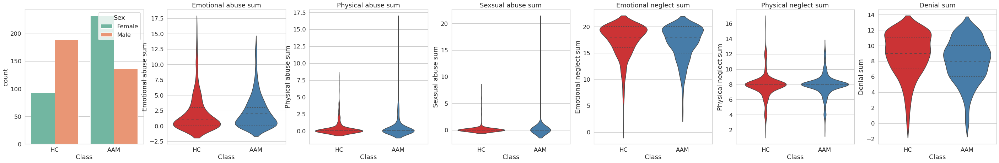

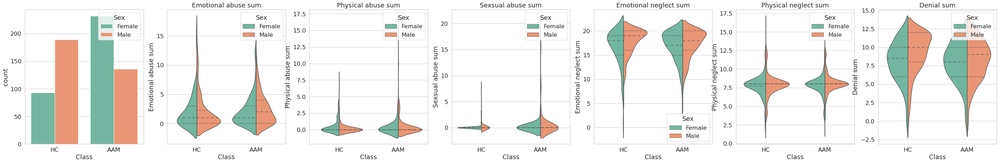

In [27]:
DF = df_binge_FU2_CTQ
COL = col_binge_FU2_CTQ

plot_binge_FU2_CTQ = IMAGEN_descriptive(DF, COL)
plot_binge_FU2_CTQ.violinplot()

### PBQ
Pregnancy and Birth Questionnaire (PBQ); self-report

In [ ]:
binge_BL_PBQ = IMAGEN_instrument()
df_binge_BL_PBQ, col_binge_BL_PBQ = binge_BL_PBQ.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5", # h5files
    "BL",                                      # session
    "IMAGEN-IMGN_PBQ_RC1-BASIC_DIGEST.csv",    # instrument
    "PBQ",                                     # name
    save = False,                              # save
    viz = True)                                # summary

In [ ]:
# plot_binge_BL_PBQ = plot_demographic(df_binge_BL_PBQ, binge_BL_PBQ.DATA)
# plot_binge_BL_PBQ.demographic_plot()

### BMI
DAWBA, BMI

### GEN
Genetics Screening and Family History of Psychiatric Disorders Interview (GEN)

### CTS
Conflict Tactics Scale (CTaS)

In [7]:
binge_FU3_CTS = IMAGEN_instrument()
df_binge_FU3_CTS, col_binge_FU3_CTS = binge_FU3_CTS.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",     # h5files
    "BL",                                          # session
    "IMAGEN-IMGN_CTS_PARENT_RC5-BASIC_DIGEST.csv", # instrument
    "CTS",                                         # name
    save = False,                                  # save
    viz = True)                                    # summary

----------------------------------------------------------------------------------- 
Step 1. load the phenotype: newlbls-fu3-espad-fu3-19a-binge-n650
        Class = Binge, n = 650 (HC = 282, AAM = 368)
Step 2. load the instrument dataset: IMAGEN-IMGN_CTS_PARENT_RC5-BASIC_DIGEST
Step 3. generate the BL_newlbls-fu3-espad-fu3-19a-binge-n650_CTS_PARENT_RC5-BASIC_DIGEST.csv
        The dataset contains 650 samples and 8 columns
Step 4. select BL_newlbls-fu3-espad-fu3-19a-binge-n650_CTS_PARENT_RC5-BASIC_DIGEST.csv
        The dataset contains 650 samples and 8 columns
        Variables = ['Assault mean', 'Injury mean', 'Negotiation mean', 'Psychological aggression mean', 'Sexual coercion mean', 'Sex', 'Site', 'Class'] 
-----------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 650 entries, 112288 to 99930021
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------       

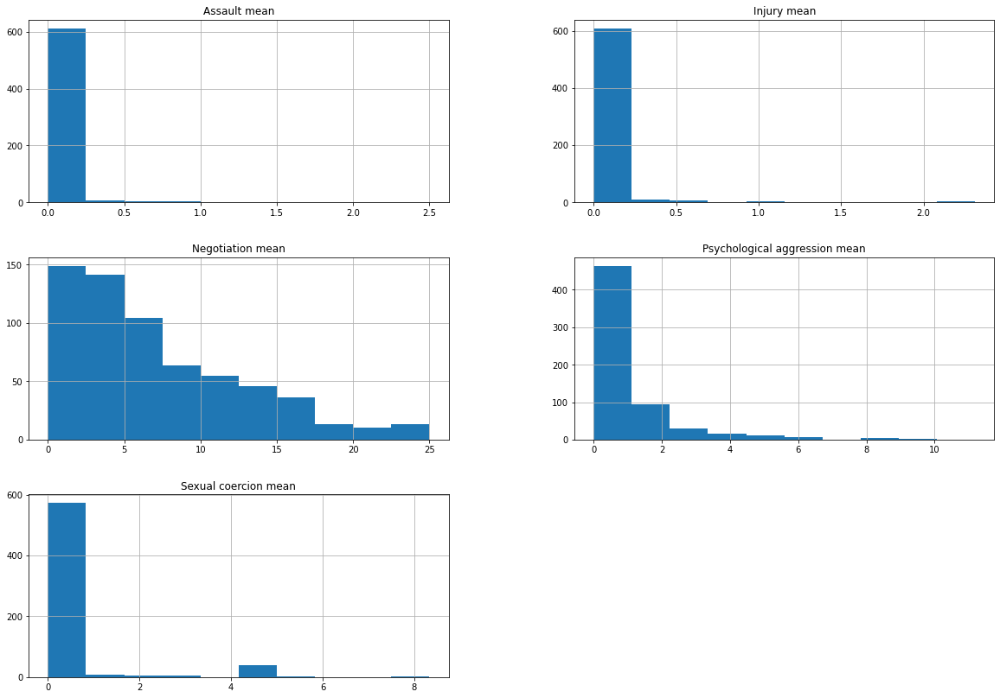

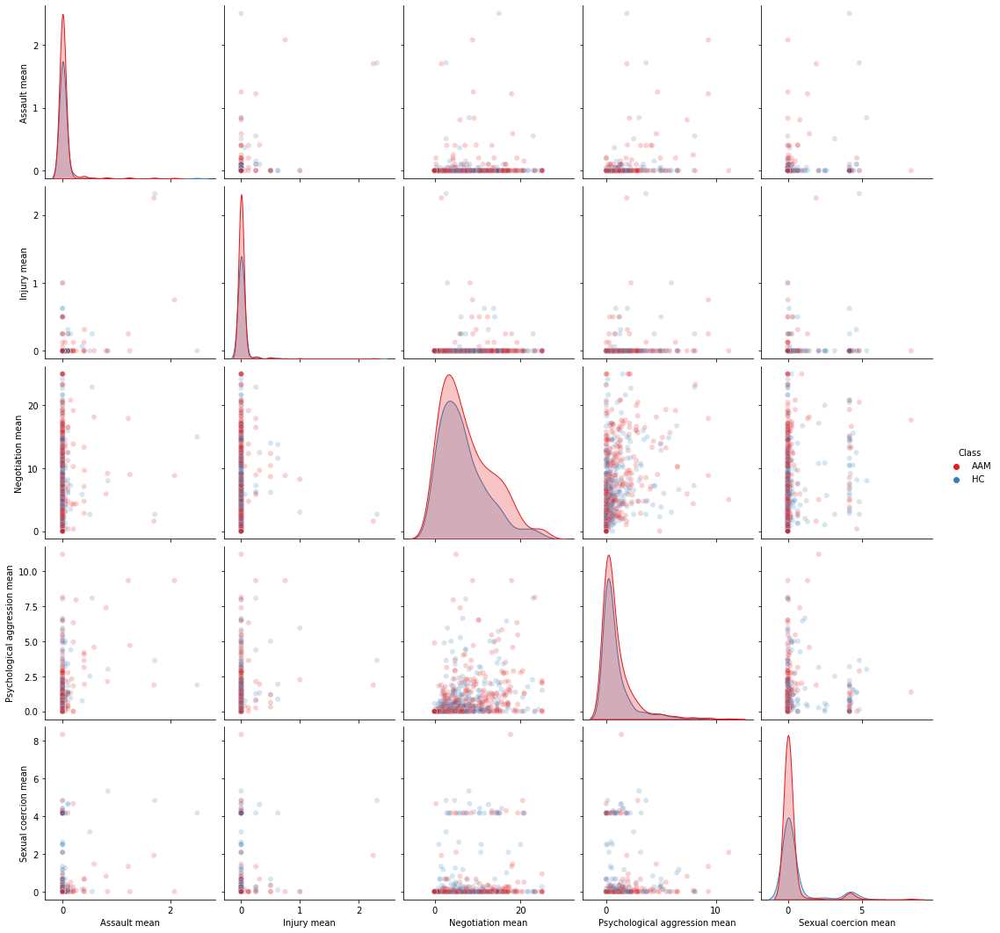

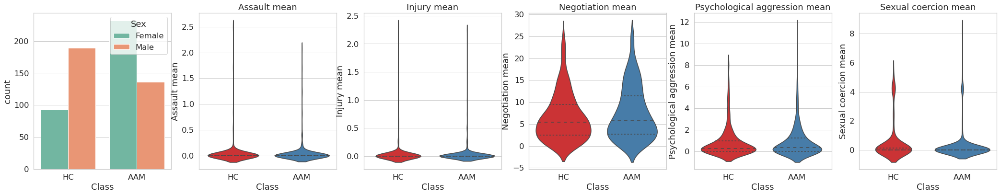

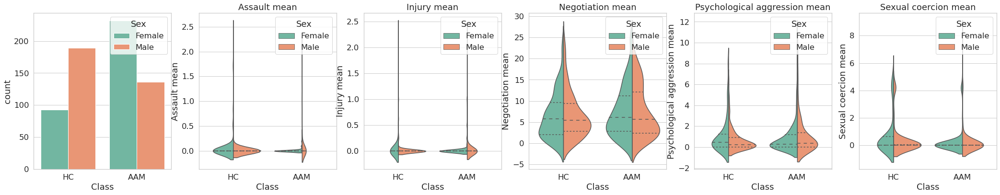

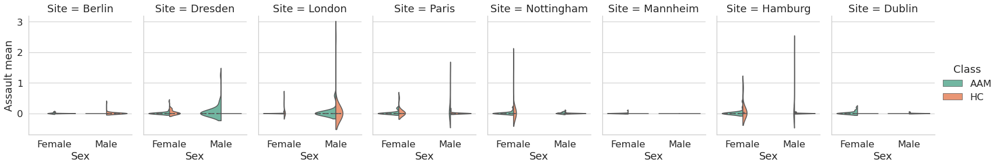

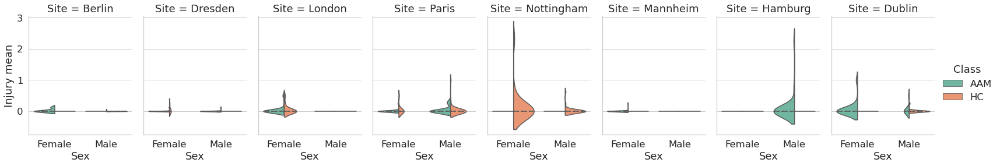

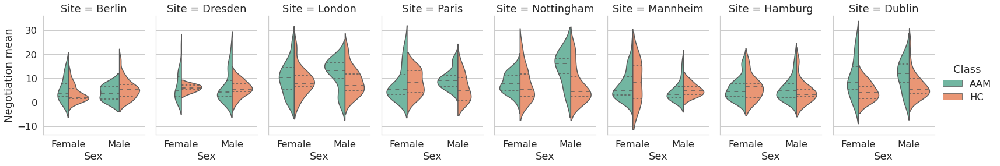

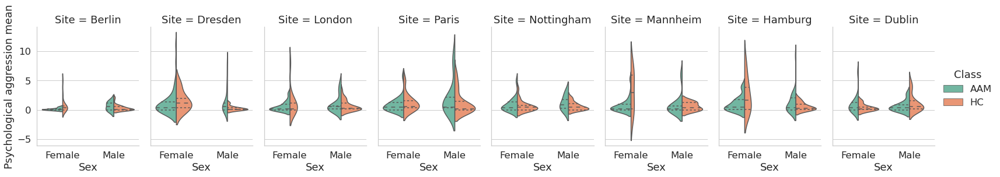

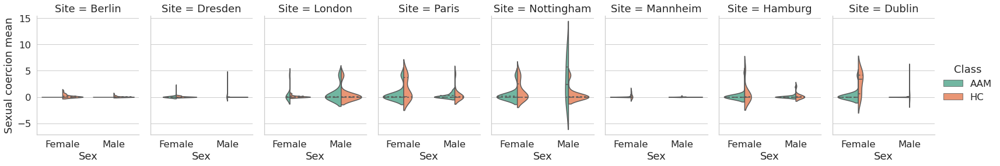

In [9]:
plot_binge_FU3_CTS = IMAGEN_descriptive(df_binge_FU3_CTS, col_binge_FU3_CTS)
plot_binge_FU3_CTS.demographic_plot()

## Other co-morbidities

### FTND
The Fagerstrom Test for Nicotine Dependence (FTND; Heatherton et al., 1991) is used to assess youth and parent nicotine dependence and smoking frequency in the past 30 days. This assessment is widely used for this purpose.

In [2]:
binge_FU3_FTND = IMAGEN_instrument()
df_binge_FU3_FTND, col_binge_FU3_FTND = binge_FU3_FTND.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5", # h5files
    "FU3",                                     # session
    "IMAGEN-IMGN_ESPAD_FU3.csv",               # instrument
    "FTND",                                    # name
    save = False,                              # save
    viz = True)                                # summary

# Table of nicotin dependence
# nd_class = pd.crosstab(index=df_binge_FU3_FTND["Class"], 
#                        columns=df_binge_FU3_FTND["Nicotine dependence"],
#                        margins=True)   # Include row and column totals

# nd_class.columns = ["less dependent","moderately dependent", "highly dependent", "coltotal"]
# nd_class.index= ["HC","AAM","rowtotal"]

# nd_class

# freq_nd_class = nd_class/nd_class.loc["rowtotal","coltotal"]

# print(f"{nd_class} \n \n {freq_nd_class}")

----------------------------------------------------------------------------------- 
Step 1. load the phenotype: newlbls-fu3-espad-fu3-19a-binge-n650
        Class = Binge, n = 650 (HC = 282, AAM = 368)
Step 2. load the instrument dataset: IMAGEN-IMGN_ESPAD_FU3
Step 3. generate the FU3_newlbls-fu3-espad-fu3-19a-binge-n650_ESPAD_FU3.csv
        The dataset contains 650 samples and 4 columns
Step 4. select FU3_newlbls-fu3-espad-fu3-19a-binge-n650_ESPAD_FU3.csv
        The dataset contains 650 samples and 4 columns
        Variables = ['Nicotine dependence', 'Sex', 'Site', 'Class'] 
-----------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 650 entries, 112288 to 99930021
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Nicotine dependence  650 non-null    object
 1   Sex                  650 non-null    object
 2   Site          

          less dependent  moderately dependent  highly dependent  coltotal
HC                     4                   343                21       368
AAM                    0                   274                 8       282
rowtotal               4                   617                29       650 
 
           less dependent  moderately dependent  highly dependent  coltotal
HC              0.006154              0.527692          0.032308  0.566154
AAM             0.000000              0.421538          0.012308  0.433846
rowtotal        0.006154              0.949231          0.044615  1.000000 



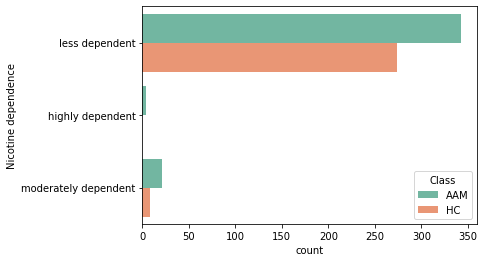

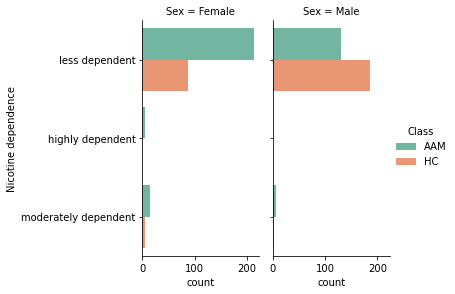

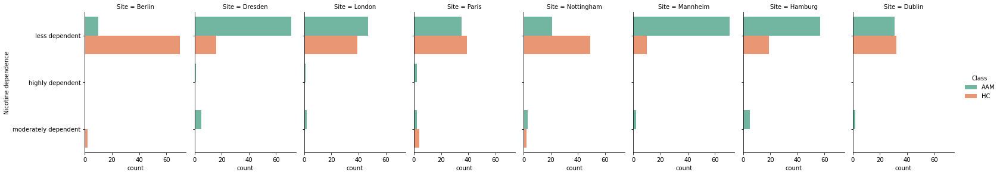

In [3]:
plot_binge_FU3_FTND = IMAGEN_descriptive(df_binge_FU3_FTND, col_binge_FU3_FTND)
plot_binge_FU3_FTND.categorical_plot()

In [4]:
binge_FU2_FTND = IMAGEN_instrument()
df_binge_FU2_FTND, col_binge_FU2_FTND = binge_FU2_FTND.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",       # h5files
    "FU2",                                           # session
    "IMAGEN-IMGN_ESPAD_CHILD_FU2-IMAGEN_DIGEST.csv", # instrument
    "FTND",                                          # name
    save = False,                                    # save
    viz = False)                                      # summary

          less dependent  moderately dependent  highly dependent  coltotal
HC                     2                   299                17       318
AAM                    0                   253                 4       257
rowtotal               2                   552                21       575 
 
           less dependent  moderately dependent  highly dependent  coltotal
HC              0.003478                  0.52          0.029565  0.553043
AAM             0.000000                  0.44          0.006957  0.446957
rowtotal        0.003478                  0.96          0.036522  1.000000 



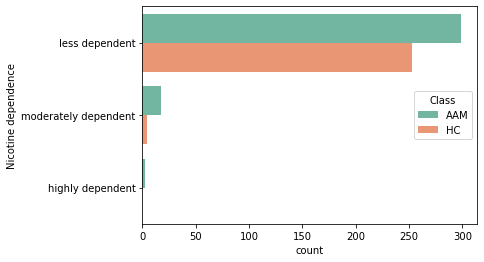

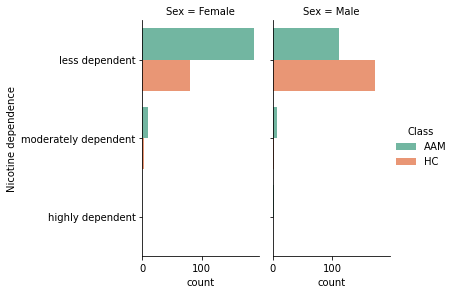

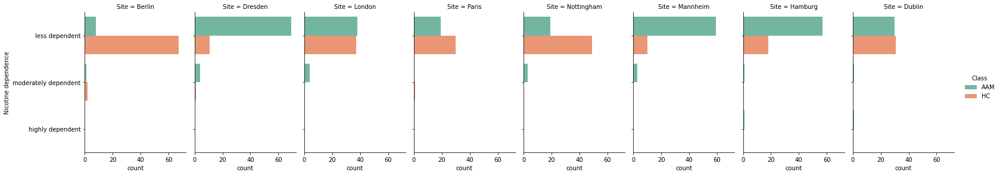

In [5]:
plot_binge_FU2_FTND = IMAGEN_descriptive(df_binge_FU2_FTND, col_binge_FU2_FTND)
plot_binge_FU2_FTND.categorical_plot()

In [2]:
binge_FU1_FTND = IMAGEN_instrument()
df_binge_FU1_FTND, col_binge_FU1_FTND = binge_FU1_FTND.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",          # h5files
    "FU1",                                              # session
    "IMAGEN-IMGN_ESPAD_CHILD_FU_RC5-IMAGEN_DIGEST.csv", # instrument
    "FTND",                                             # name
    save = False,                                       # save
    viz = False)                                         # summary

          less dependent  moderately dependent  coltotal
HC                   324                     5       329
AAM                  244                     4       248
rowtotal             568                     9       577 
 
           less dependent  moderately dependent  coltotal
HC              0.561525              0.008666  0.570191
AAM             0.422877              0.006932  0.429809
rowtotal        0.984402              0.015598  1.000000 



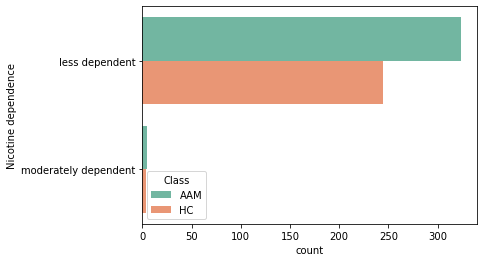

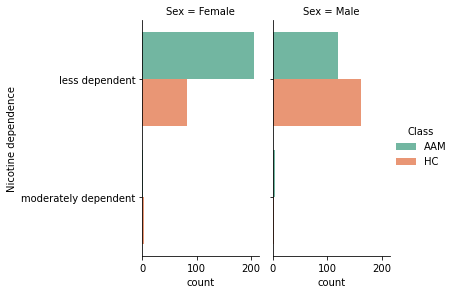

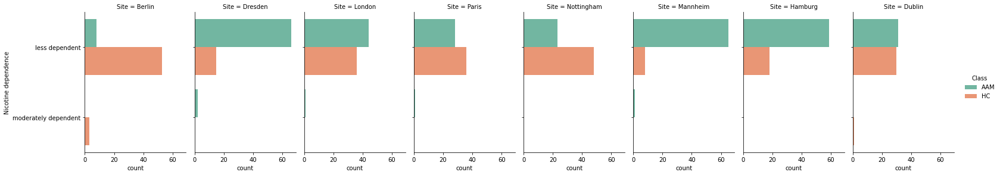

In [4]:
plot_binge_FU1_FTND = IMAGEN_descriptive(df_binge_FU1_FTND, col_binge_FU1_FTND)
plot_binge_FU1_FTND.categorical_plot()

In [5]:
binge_BL_FTND = IMAGEN_instrument()
df_binge_BL_FTND, col_binge_BL_FTND = binge_BL_FTND.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5",       # h5files
    "BL",                                            # session
    "IMAGEN-IMGN_ESPAD_CHILD_RC5-IMAGEN_DIGEST.csv", # instrument
    "FTND",                                          # name
    save = False,                                    # save
    viz = False)                                      # summary

          less dependent  moderately dependent  coltotal
HC                   366                     1       367
AAM                  280                     0       280
rowtotal             646                     1       647 
 
           less dependent  moderately dependent  coltotal
HC              0.565688              0.001546  0.567233
AAM             0.432767              0.000000  0.432767
rowtotal        0.998454              0.001546  1.000000 



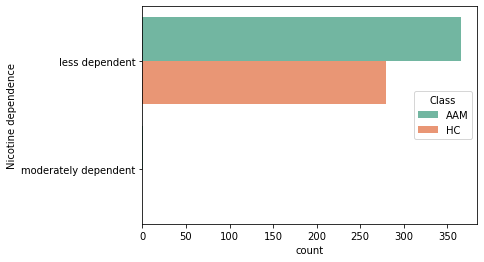

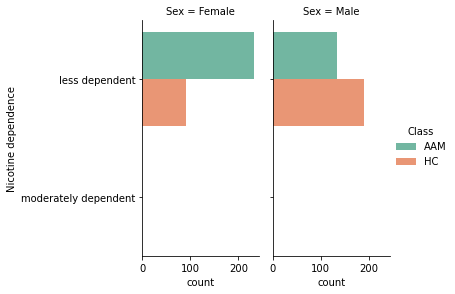

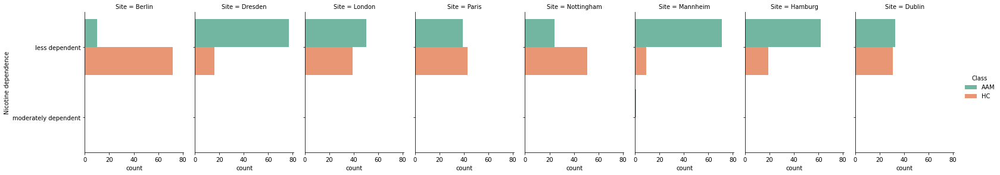

In [6]:
plot_binge_FU1_FTND = IMAGEN_descriptive(df_binge_BL_FTND.dropna(), col_binge_FU1_FTND)
plot_binge_FU1_FTND.categorical_plot()

### DAST
The DAST is one of the most widely used screening tests for drug abuse and addiction. In order to assess a more specific measure for alcohol related problems in adults, the AUDIT and Michigan Alcohol Screening Test (MAST; Selzer, 1971) will be administered to all parents.

### SCID-SUD
This section checks for drug and alcohol abuse disorder (SUD, AUD) criteria according to DSM-IV in order to not only capture substance abuse but also dependence disorders which become more and more relevant with increasing age of the adolescents. Sections of the Structured Clinical Interview for DSM-IV (modified for use with adolescents, adapted from Martin et al., 1995) have been added to the ESPAD questionnaire already asking about alcohol and substance use. Several studies have demonstrated high diagnostic reliability of both alcohol and substance use disorders SCID sections among adolescents (Martin et al., 2000; Chung et al., 2005). In order to keep the assessment short, stringent and to avoid repetition, extra questions on substances will be added to the existing questionnaire structure, only asking further detailed questions in case adolescents indicate use in prior items.

### DMQ
The Drinking Motives Questionnaire - Revised (DMQ-R; by Cooper, 1994) breaks the motivation to use alcohol into 4 components:

### BSI-53
The BSI is one of the most widely accepted psychometric screening tools of general psychopathology in both research and clinical practice (Derogatis, 1975; Derogatis & Melisaratos, 1983; Derogatis & Spencer, 1982).

CAUTION: BSI-53 data type are the sting not numerical data type

In [ ]:
binge_FU3_BSI = IMAGEN_instrument()
df_binge_FU3_BSI, col_binge_FU3_BSI = binge_FU3_BSI.to_instrument(
    "newlbls-fu3-espad-fu3-19a-binge-n650.h5", # h5files
    "FU3",                                     # session
    "IMAGEN-IMGN_BSI_FU3.csv",                 # instrument
    "BSI",                                     # name
    save = False,                              # save
    viz = True)                                # summary

### AUDIT
Substance use is assessed using the Alcohol Use Disorders Identification Test (AUDIT; Saunders et al., 1993), which was developed and validated by the World Health Organization to assist the brief assessment of alcohol use disorders and was specifically designed for international use. It exists in multiple languages, including German, French and English, and was validated on primary health care patients in six countries.

### MAST
The MAST is one of the most widely accepted measures for assessing alcohol abuse, and is designed to provide a rapid and effective screening for lifetime alcohol-related problems and alcoholism. BL, FU1 are self-reported